<div style="background-color: #007bff; color: white; padding: 10px; border-radius: 5px; font-size: 24px; font-weight: bold;">
    <div style="text-align: center;">UniTable Exploration: Understanding Table Recognition</div>
</div>

## **Introduction**

In this notebook, we will explore how the [UniTable](https://github.com/poloclub/unitable) framework recognizes tables step by step:

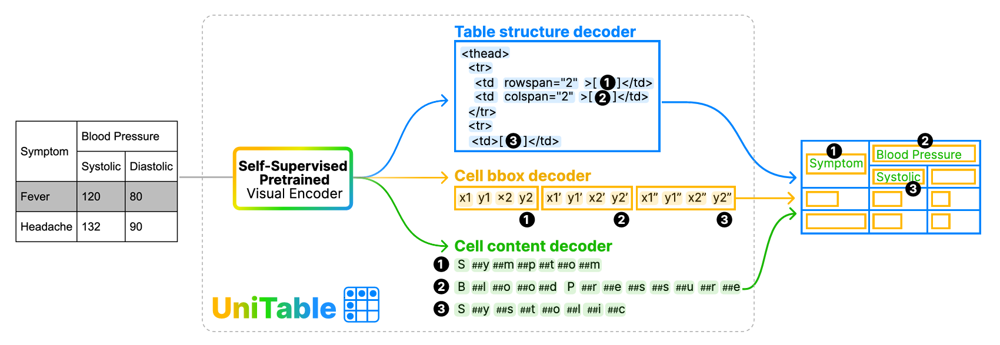

- **Step 1: Image Input**: The process starts with a picture of a table (e.g., with "Fever" and "120/80").
- **Step 2: Visual Learning**: The visual encoder studies the image on its own first, learning to "see" the table’s patterns without labels.
- **Step 3: Layout Detection**: The table structure decoder figures out the table’s organization, like rows and cells (e.g., `<tr>` and `<td>`).
- **Step 4: Box Drawing**: The cell box decoder draws boxes around each cell to mark where the data is located.
- **Step 5: Text Reading**: The cell content decoder reads the text inside each box, like "Fever" or "120."
- **Step 6: Combining Results**: All parts work together to create a complete digital table.
- **Step 7: HTML Output**: The final table is turned into an HTML format for easy computer use.

# **1. Clone the repository**

In [1]:
! git clone https://github.com/poloclub/unitable.git
%cd unitable

Cloning into 'unitable'...
remote: Enumerating objects: 247, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 247 (delta 29), reused 27 (delta 11), pack-reused 171 (from 1)
Receiving objects: 100% (247/247), 38.79 MiB | 16.60 MiB/s, done.
Resolving deltas: 100% (57/57), done.
/kaggle/working/unitable


In [2]:
! ls

CONFIG.mk  dataset	LICENSE   notebooks  requirements.txt  src    website
configs    experiments	Makefile  README.md  setup.py	       vocab


# **2. Install Libraries**

In [3]:
%%capture
! pip install -r requirements.txt

In [4]:
%%capture
! pip uninstall -y torch torchvision torchtext
! pip install torch==2.1.0 torchvision==0.16.0 torchtext==0.16.0

# **3. Download Model Weights**

In [5]:
! make .done_download_weights

There should be 9 weights file under experiments/unitable_weights, but only 0 are found.
Begin downloading weights from HuggingFace ...
Completed!
wget -c https://huggingface.co/poloclub/UniTable/resolve/main/vqvae_1m.pt -P experiments/unitable_weights
--2025-07-16 16:22:06--  https://huggingface.co/poloclub/UniTable/resolve/main/vqvae_1m.pt
Resolving huggingface.co (huggingface.co)... 18.67.181.126, 18.67.181.124, 18.67.181.100, ...
Connecting to huggingface.co (huggingface.co)|18.67.181.126|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.hf.co/repos/ae/5d/ae5d1b0b88d46be5e4eca7d45b523eaf4e684d4efc4d92894ec79624e0abecd6/e20acaaad23e7f2fafeb286238e48b478ccc42437ab7cff10769f85e584f941e?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27vqvae_1m.pt%3B+filename%3D%22vqvae_1m.pt%22%3B&Expires=1752686526&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTc1MjY4NjUyNn19LCJSZXNvdXJjZSI6Imh0dHB

# **4. Import Libraries**

In [6]:
%load_ext autoreload
%autoreload 2

from IPython.display import display, HTML

from typing import Tuple, List, Sequence, Optional, Union
from pathlib import Path
import re
import torch
import tokenizers as tk
from PIL import Image
from matplotlib import pyplot as plt
from matplotlib import patches
from torchvision import transforms
from torch import nn, Tensor
from functools import partial
from bs4 import BeautifulSoup as bs
import warnings
import time

from src.model import EncoderDecoder, ImgLinearBackbone, Encoder, Decoder
from src.utils import subsequent_mask, pred_token_within_range, greedy_sampling, bbox_str_to_token_list, cell_str_to_token_list, html_str_to_token_list, build_table_from_html_and_cell, html_table_template
from src.trainer.utils import VALID_HTML_TOKEN, VALID_BBOX_TOKEN, INVALID_CELL_TOKEN

warnings.filterwarnings('ignore')
device = torch.device("cuda:0")

# **5. Inference**

### Check if the model weights exist

In [7]:
# Check all model weights have been downloaded to experiments/unitable_weights
MODEL_FILE_NAME = ["unitable_large_structure.pt", "unitable_large_bbox.pt", "unitable_large_content.pt"]
MODEL_DIR = Path("./experiments/unitable_weights")

assert all([(MODEL_DIR / name).is_file() for name in MODEL_FILE_NAME]), f"Please download model weights from HuggingFace: https://huggingface.co/poloclub/UniTable/tree/main"

In [8]:
# UniTable large model
d_model = 768
patch_size = 16
nhead = 12
dropout = 0.2

backbone = ImgLinearBackbone(d_model=d_model, patch_size=patch_size)
encoder = Encoder(
    d_model=d_model,
    nhead=nhead,
    dropout = dropout,
    activation="gelu",
    norm_first=True,
    nlayer=12,
    ff_ratio=4,
)
decoder = Decoder(
    d_model=d_model,
    nhead=nhead,
    dropout = dropout,
    activation="gelu",
    norm_first=True,
    nlayer=4,
    ff_ratio=4,
)

In [9]:
def autoregressive_decode(
    model: EncoderDecoder,
    image: Tensor,
    prefix: Sequence[int],
    max_decode_len: int,
    eos_id: int,
    token_whitelist: Optional[Sequence[int]] = None,
    token_blacklist: Optional[Sequence[int]] = None,
) -> Tensor:
    model.eval()
    with torch.no_grad():
        memory = model.encode(image)
        context = torch.tensor(prefix, dtype=torch.int32).repeat(image.shape[0], 1).to(device)

    for _ in range(max_decode_len):
        eos_flag = [eos_id in k for k in context]
        if all(eos_flag):
            break

        with torch.no_grad():
            causal_mask = subsequent_mask(context.shape[1]).to(device)
            logits = model.decode(
                memory, context, tgt_mask=causal_mask, tgt_padding_mask=None
            )
            logits = model.generator(logits)[:, -1, :]

        logits = pred_token_within_range(
            logits.detach(),
            white_list=token_whitelist,
            black_list=token_blacklist,
        )

        next_probs, next_tokens = greedy_sampling(logits)
        context = torch.cat([context, next_tokens], dim=1)
    return context

def load_vocab_and_model(
    vocab_path: Union[str, Path],
    max_seq_len: int,
    model_weights: Union[str, Path],
) -> Tuple[tk.Tokenizer, EncoderDecoder]:
    vocab = tk.Tokenizer.from_file(vocab_path)
    model = EncoderDecoder(
        backbone=backbone,
        encoder=encoder,
        decoder=decoder,
        vocab_size=vocab.get_vocab_size(),
        d_model=d_model,
        padding_idx=vocab.token_to_id("<pad>"),
        max_seq_len=max_seq_len,
        dropout=dropout,
        norm_layer=partial(nn.LayerNorm, eps=1e-6)
    )

    model.load_state_dict(torch.load(model_weights, map_location="cpu"))
    model = model.to(device)
    return vocab, model

def image_to_tensor(image: Image, size: Tuple[int, int]) -> Tensor:
    T = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.86597056,0.88463002,0.87491087], std = [0.20686628,0.18201602,0.18485524])
    ])
    image_tensor = T(image)
    image_tensor = image_tensor.to(device).unsqueeze(0)

    return image_tensor

def rescale_bbox(
    bbox: Sequence[Sequence[float]],
    src: Tuple[int, int],
    tgt: Tuple[int, int]
) -> Sequence[Sequence[float]]:
    assert len(src) == len(tgt) == 2
    ratio = [tgt[0] / src[0], tgt[1] / src[1]] * 2
    bbox = [[int(round(i * j)) for i, j in zip(entry, ratio)] for entry in bbox]
    return bbox

In [10]:
def recognize_table(table_image_path):
    """
    Recognizes and extracts a table from an image, displaying the following in sequence:
    1. The original image.
    2. The image with the detected bounding boxes for table cells.
    3. The final reconstructed HTML table based on the detected structure and cell content.

    Args:
        table_image_path (str): Path to the image file containing the table to be recognized.

    Returns:
        None: Displays the original image, detected bounding boxes, and the final table as an HTML.
    """

    start_time = time.time()

    # Load tabular image
    image_name = "table_to_recognize.jpg"
    image = Image.open(table_image_path).convert("RGB")
    image_size = image.size

    # ---------------------------------------------------
    # 1. Display the original image
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.imshow(image)
    ax.set_title("Original Table Image")
    ax.set_axis_off()
    plt.show()

    # Table structure extraction
    vocab_table_structure_extraction, model_table_structure_extraction = load_vocab_and_model(
        vocab_path="./vocab/vocab_html.json",
        max_seq_len=784,
        model_weights=MODEL_DIR / MODEL_FILE_NAME[0],
    )

    # Image transformation
    image_tensor = image_to_tensor(image, size=(448, 448))

    # Inference
    pred_html = autoregressive_decode(
        model=model_table_structure_extraction,
        image=image_tensor,
        prefix=[vocab_table_structure_extraction.token_to_id("[html]")],
        max_decode_len=512,
        eos_id=vocab_table_structure_extraction.token_to_id("<eos>"),
        token_whitelist=[vocab_table_structure_extraction.token_to_id(i) for i in VALID_HTML_TOKEN],
        token_blacklist=None
    )

    # Convert token id to token text
    pred_html = pred_html.detach().cpu().numpy()[0]
    pred_html = vocab_table_structure_extraction.decode(pred_html, skip_special_tokens=False)
    pred_html = html_str_to_token_list(pred_html)

    # ---------------------------------------------------
    # 2. Table cell bbox detection
    vocab_cell_box_det, model_cell_box_det = load_vocab_and_model(
        vocab_path="./vocab/vocab_bbox.json",
        max_seq_len=1024,
        model_weights=MODEL_DIR / MODEL_FILE_NAME[1],
    )

    # Image transformation
    image_tensor = image_to_tensor(image, size=(448, 448))

    # Inference
    pred_bbox = autoregressive_decode(
        model=model_cell_box_det,
        image=image_tensor,
        prefix=[vocab_cell_box_det.token_to_id("[bbox]")],
        max_decode_len=1024,
        eos_id=vocab_cell_box_det.token_to_id("<eos>"),
        token_whitelist=[vocab_cell_box_det.token_to_id(i) for i in VALID_BBOX_TOKEN[: 449]],
        token_blacklist=None
    )

    # Convert token id to token text
    pred_bbox = pred_bbox.detach().cpu().numpy()[0]
    pred_bbox = vocab_cell_box_det.decode(pred_bbox, skip_special_tokens=False)

    # Visualize detected bbox
    pred_bbox = bbox_str_to_token_list(pred_bbox)
    pred_bbox = rescale_bbox(pred_bbox, src=(448, 448), tgt=image_size)

    # Display image with detected bounding boxes
    fig, ax = plt.subplots(figsize=(12, 10))
    for i in pred_bbox:
        rect = patches.Rectangle(i[:2], i[2] - i[0], i[3] - i[1], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    ax.set_title("Detected Table Cell Bboxes")
    ax.set_axis_off()
    ax.imshow(image)
    plt.show()

    # ---------------------------------------------------
    # 3. Table cell content recognition
    vocab, model = load_vocab_and_model(
        vocab_path="./vocab/vocab_cell_6k.json",
        max_seq_len=200,
        model_weights=MODEL_DIR / MODEL_FILE_NAME[2],
    )

    # Cell image cropping and transformation
    image_tensor = [image_to_tensor(image.crop(bbox), size=(112, 448)) for bbox in pred_bbox]
    image_tensor = torch.cat(image_tensor, dim=0)

    # Inference
    pred_cell = autoregressive_decode(
        model=model,
        image=image_tensor,
        prefix=[vocab.token_to_id("[cell]")],
        max_decode_len=200,
        eos_id=vocab.token_to_id("<eos>"),
        token_whitelist=None,
        token_blacklist=[vocab.token_to_id(i) for i in INVALID_CELL_TOKEN]
    )

    # Convert token id to token text
    pred_cell = pred_cell.detach().cpu().numpy()
    pred_cell = vocab.decode_batch(pred_cell, skip_special_tokens=False)
    pred_cell = [cell_str_to_token_list(i) for i in pred_cell]
    pred_cell = [re.sub(r'(\d).\s+(\d)', r'\1.\2', i) for i in pred_cell]

    # ---------------------------------------------------
    # 4. Combine the table structure and cell content
    pred_code = build_table_from_html_and_cell(pred_html, pred_cell)
    pred_code = "".join(pred_code)
    pred_code = html_table_template(pred_code)

    # Display the final HTML table
    soup = bs(pred_code)
    table_code = soup.prettify()
    display(HTML(table_code))

    end_time = time.time()
    execution_time = end_time - start_time
    print(f"Execution time: {execution_time} seconds")

## **Example n°1**

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 8.34 µs


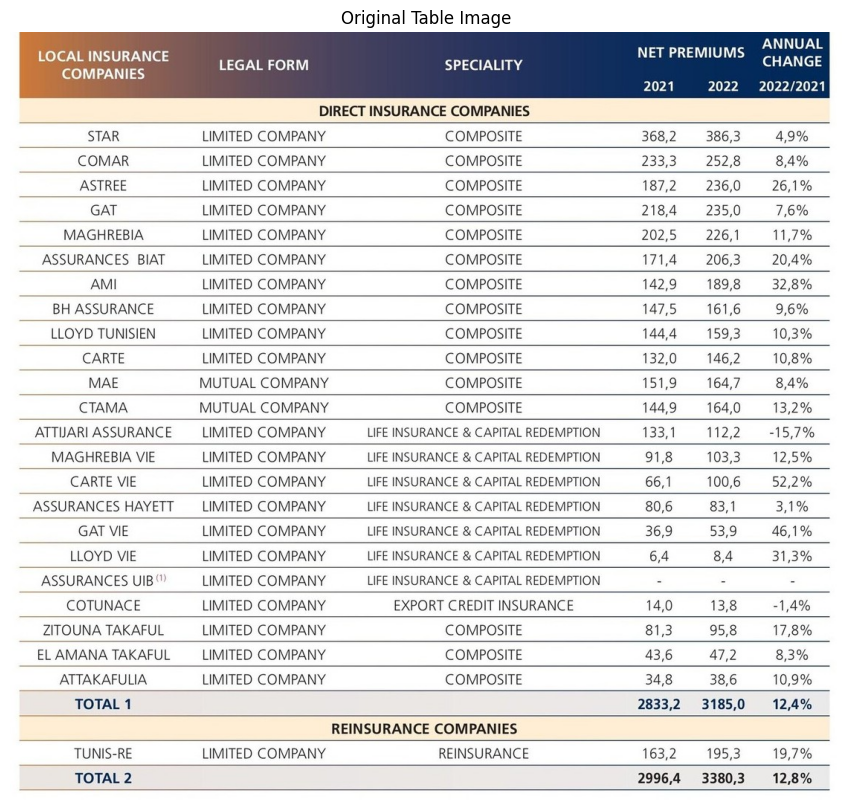

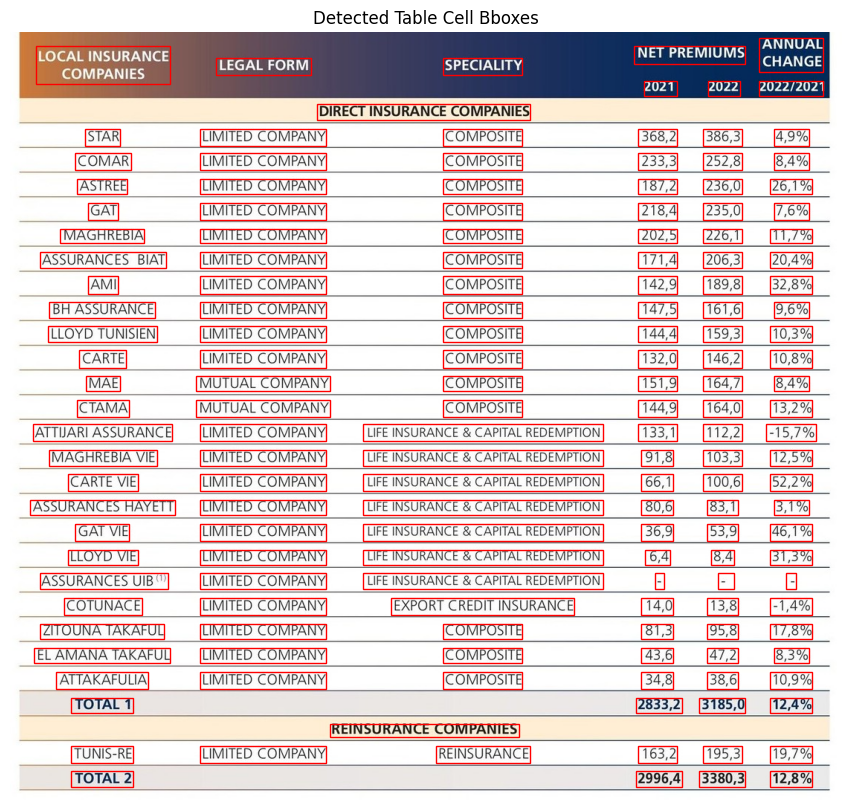

Execution time: 21.465975999832153 seconds


In [11]:
%time
recognize_table("/kaggle/input/tables-different-cases-cropped/RAP_CGA_FR_ANG_2022-images-79 (1) (1)_cropped.jpg")

## **Example n°2**

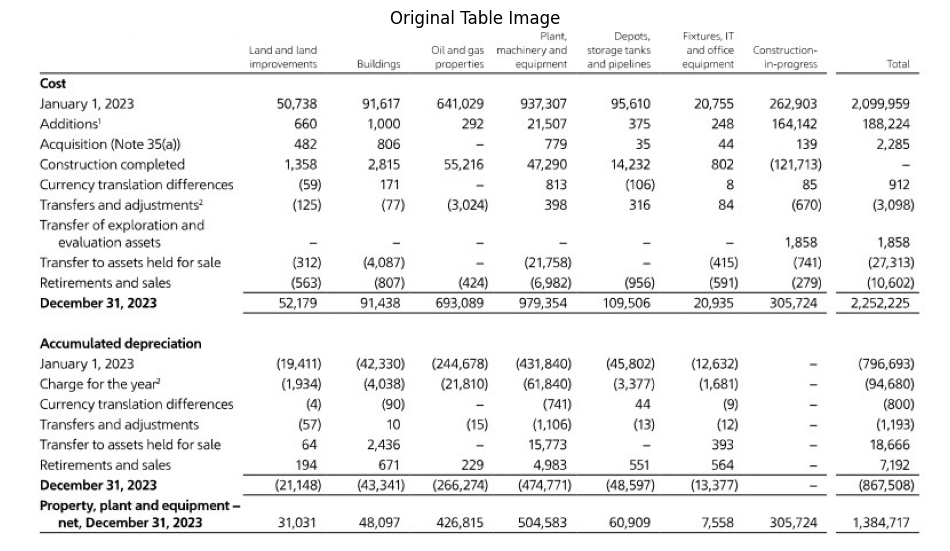

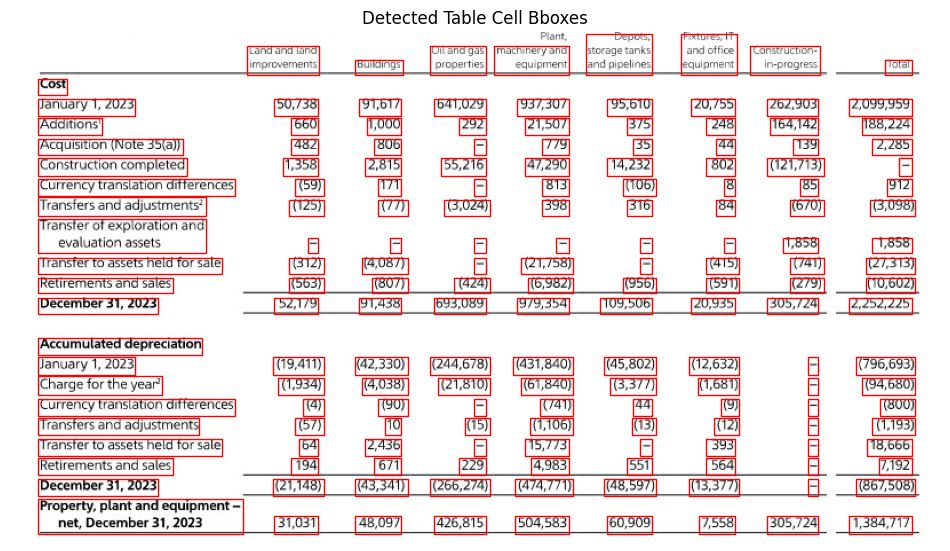

Execution time: 26.63510799407959 seconds


In [12]:
recognize_table("/kaggle/input/tables-different-cases-cropped/aramco_table_1.jpg")

## **Example n°3**

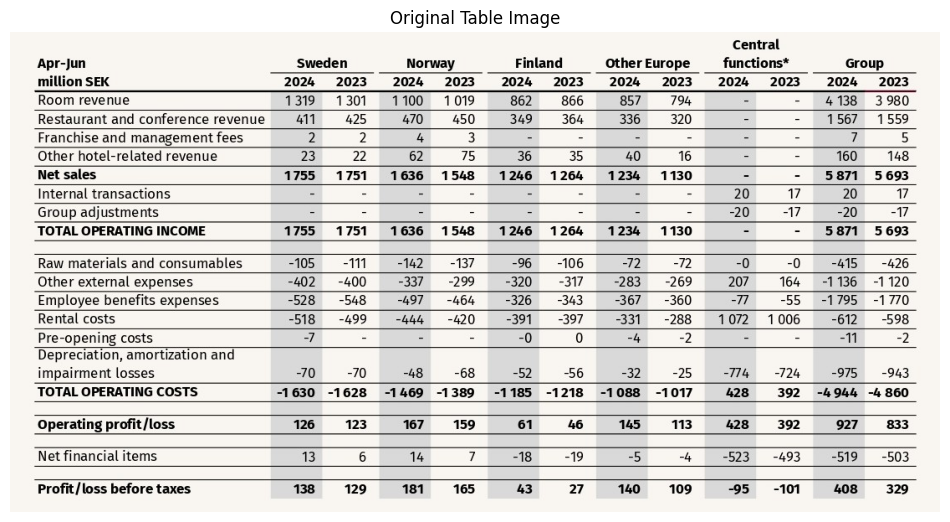

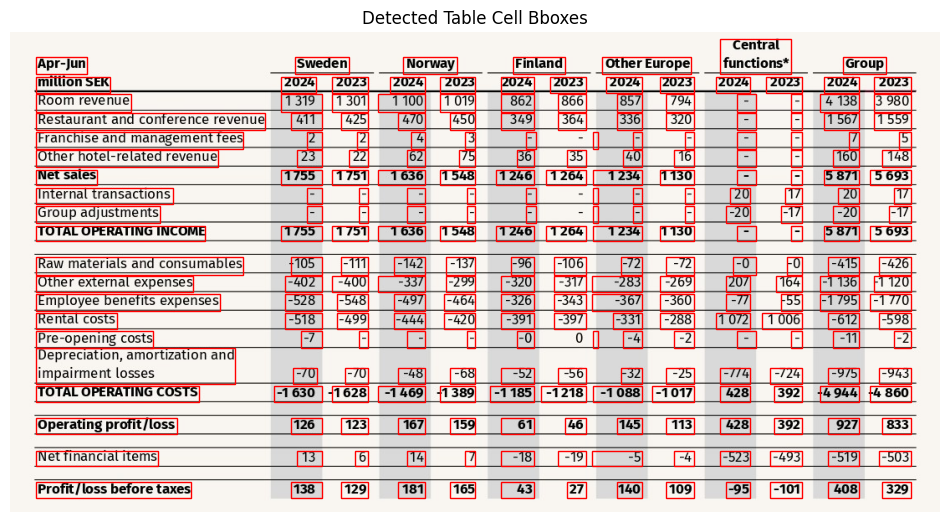

Execution time: 48.577181577682495 seconds


In [13]:
recognize_table("/kaggle/input/tables-different-cases-cropped/the-full-report-pdf_page-0026_cropped.jpg")

## **Example n°4**

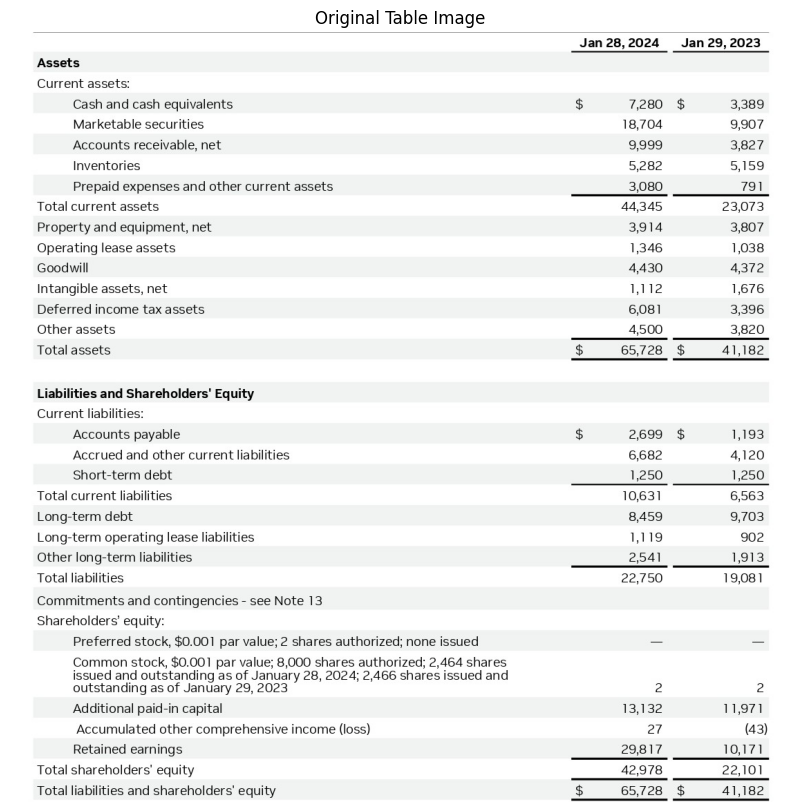

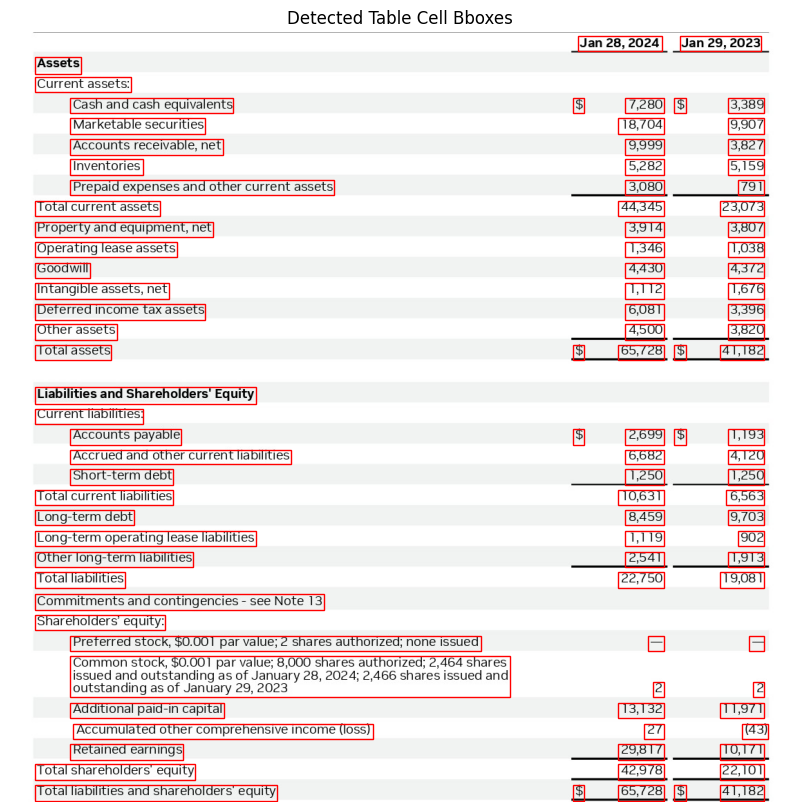

Execution time: 63.52041840553284 seconds


In [14]:
recognize_table("/kaggle/input/tables-different-cases-cropped/NVIDIA_Report_Removed_Pages-1-16-14_page-0001_cropped.jpg")

## **Example n°5**

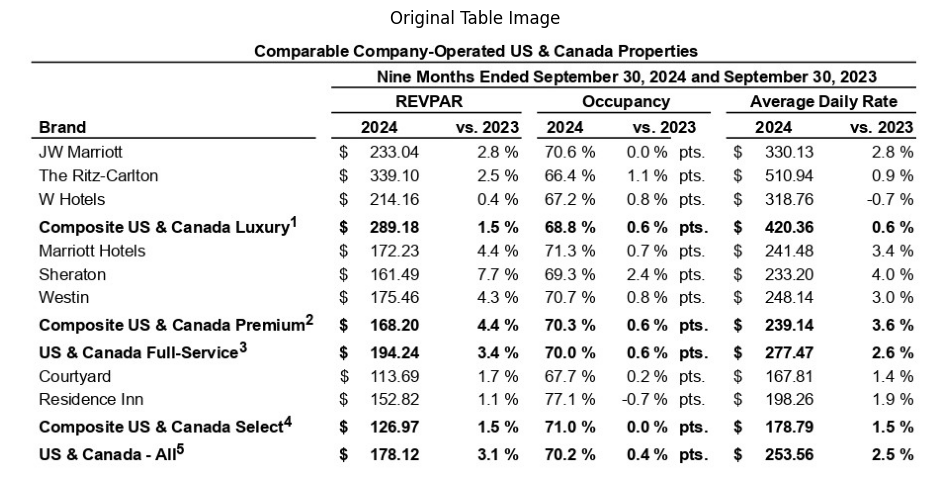

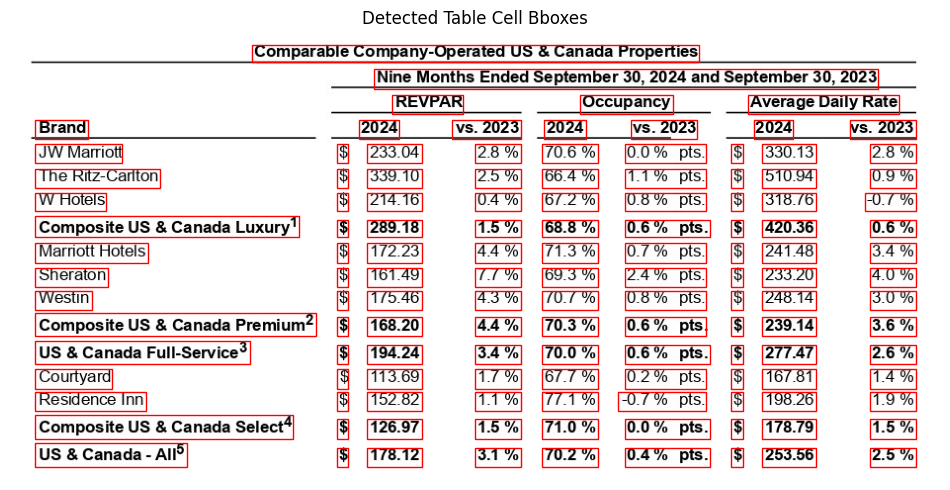

Execution time: 24.001503229141235 seconds


In [15]:
recognize_table("/kaggle/input/tables-different-cases-cropped/Marriott International Reports Third Quarter 2024 Results_page-0011_cropped.jpg")

## **Example n°6**

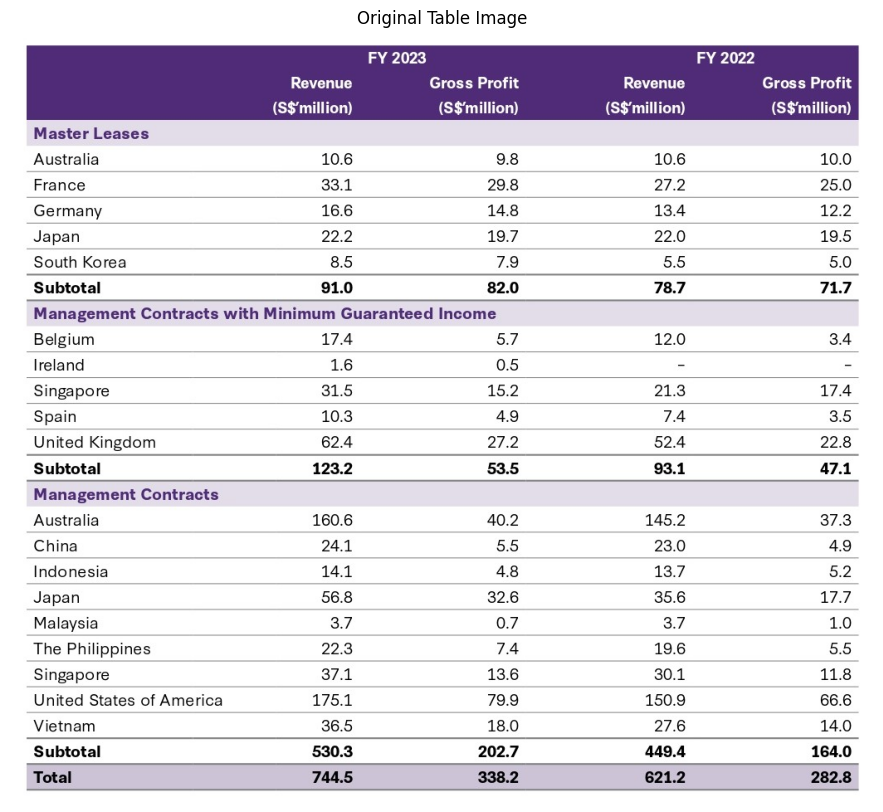

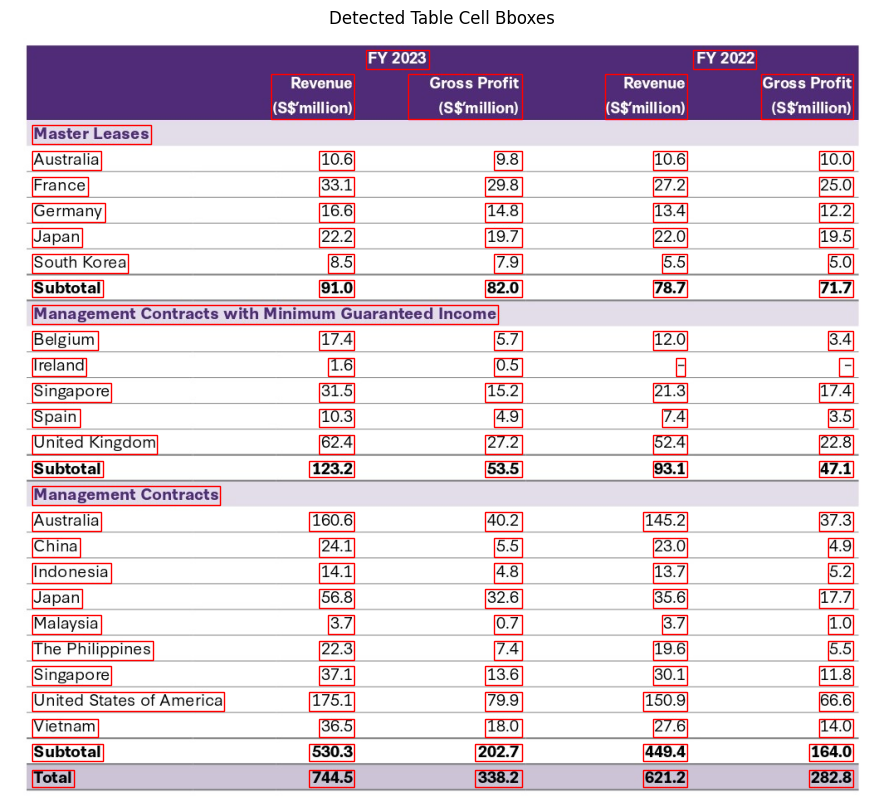

Execution time: 22.395230770111084 seconds


In [16]:
recognize_table("/kaggle/input/tables-different-cases-cropped/CLAS-FY2023-AR_page-0066_cropped.jpg")

## **Example n°7**

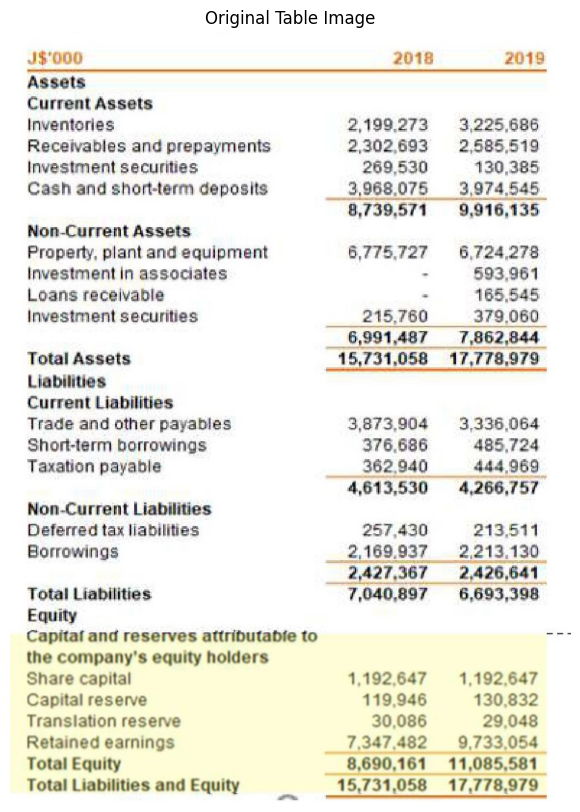

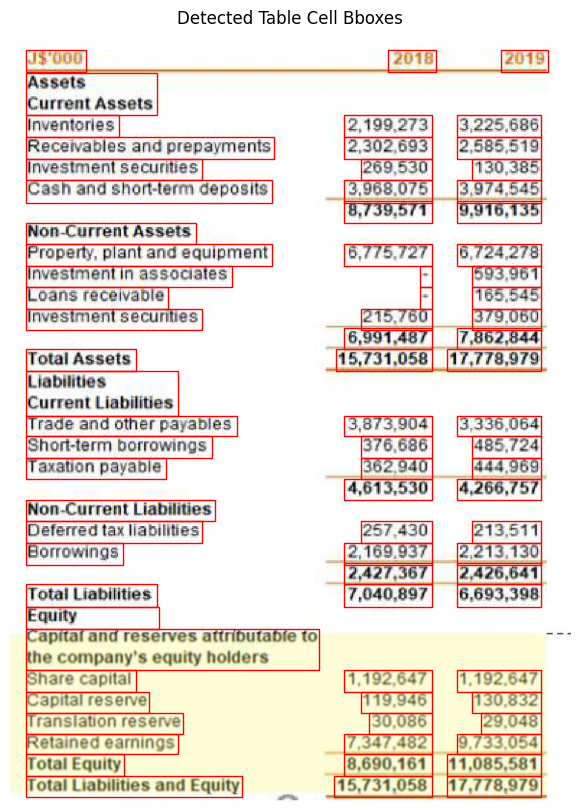

J $’ 000,2018,2019
Assets Current Assets,,
Inventories,2.199.273,3.225.686
Receivables and prepayments,2.302.693,2.585.519
Investment securities,269.530,130.385
Cash and short - term deposits,3.968.075,"3.974.545,"
,8.739.571,9.916.135
Non - Current Assets,,
"Property, plant and equipment",6.775.727,6.724.278
Investment in associates,-,593.961
Loans receivable,-,165.545


Execution time: 16.439528465270996 seconds


In [17]:
recognize_table("/kaggle/input/tables-different-cases-cropped/table_1_cropped.jpg")

## **Example n°8**

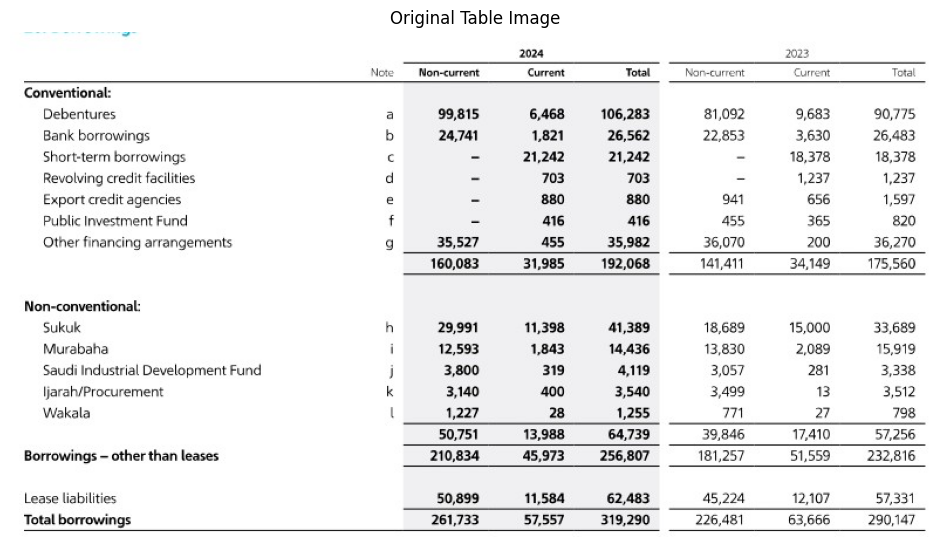

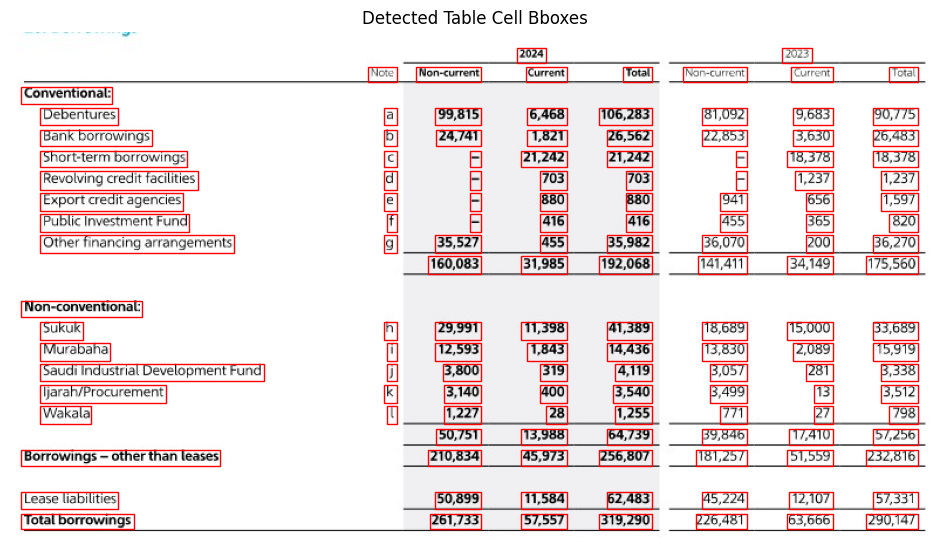

Execution time: 20.76192331314087 seconds


In [18]:
recognize_table("/kaggle/input/tables-different-cases-cropped/aramco_table_6.jpg")

## **Example n°9**

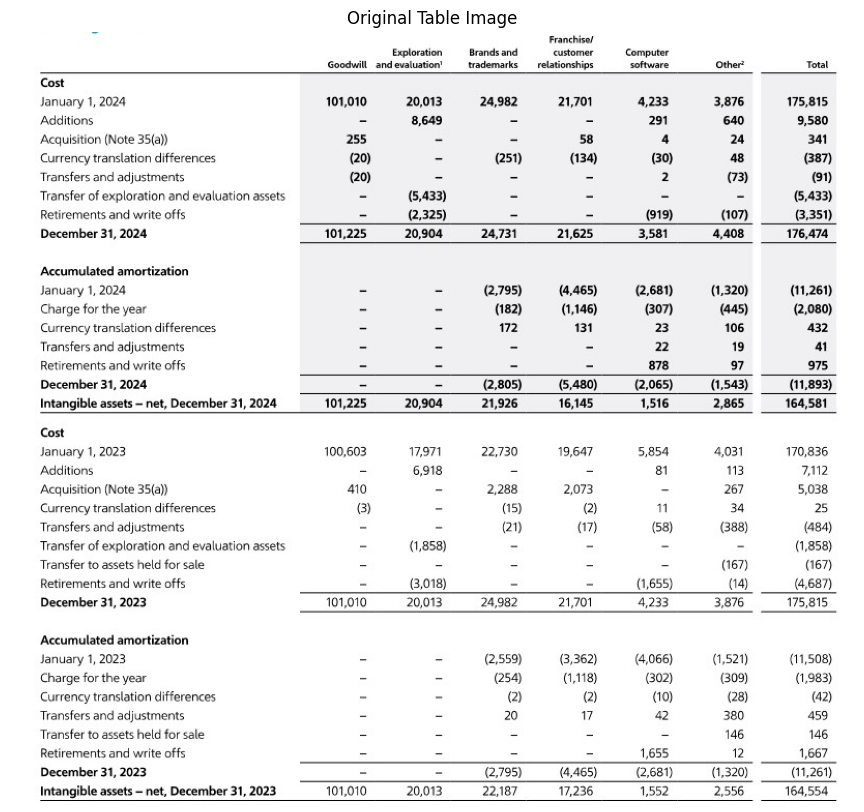

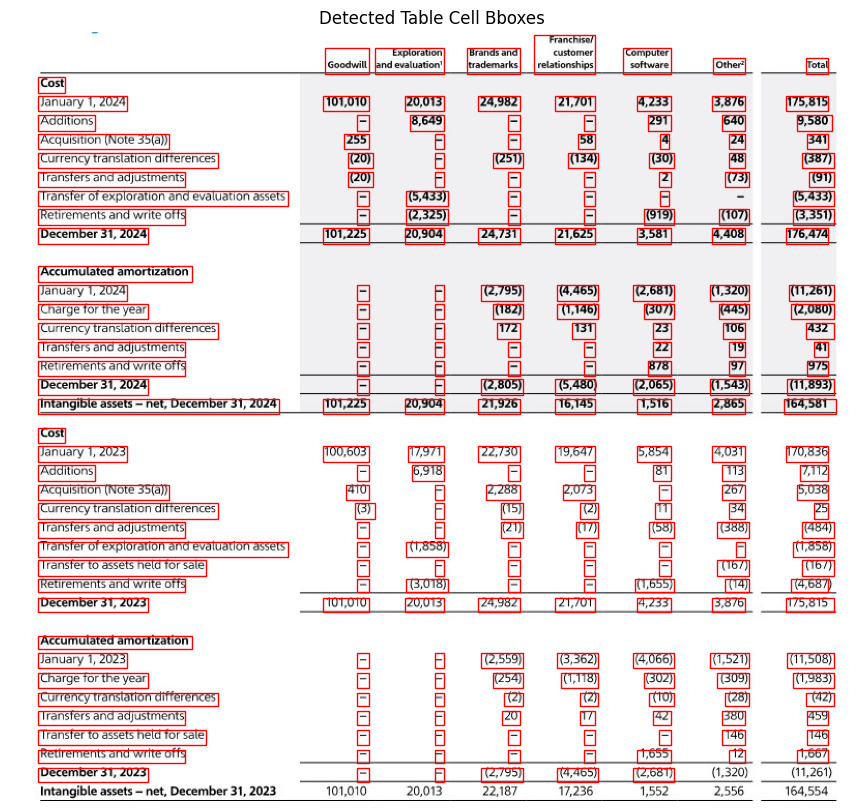

Execution time: 52.02053713798523 seconds


In [19]:
recognize_table("/kaggle/input/tables-different-cases-cropped/aramco_table_3.jpg")

## **Example n°10**

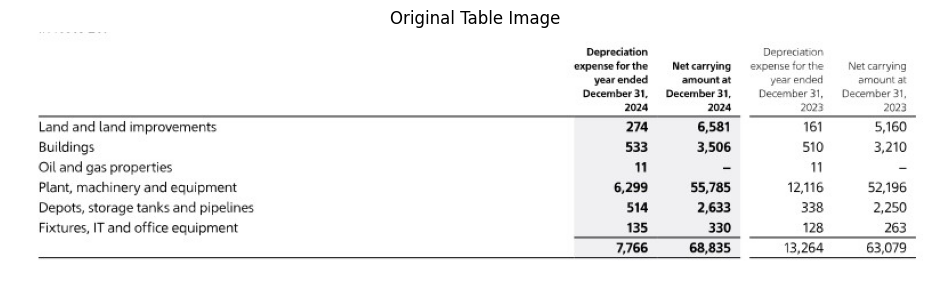

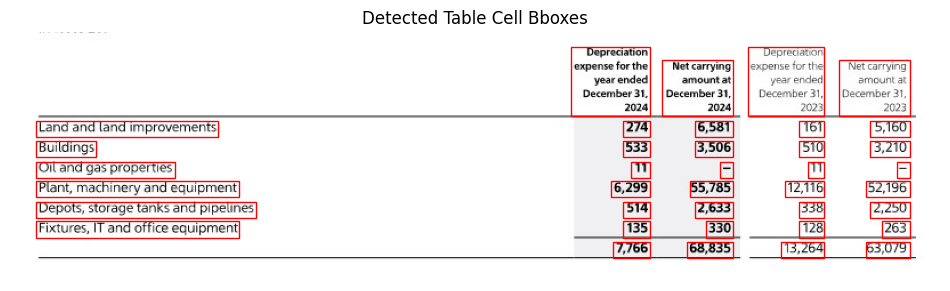

,Depreciation expense for the year ended December 31.2024,Net carrying amount at December 31.2024,Depreciation expense for the year ended December 31.2023,Net carrying amount at December 31.2023
Land and land improvements,274,6.581,161,5.160
Buildings,533,3.506,510,3.210
Oil and gas properties,11,2,11,-
"Plant, machinery and equipment",6.299,55.785,12.116,52.196
"Depots, storage tanks and pipelines",514,2.633,338,2.250
"Fixtures, IT and office equipment",135,330,128,263
,7.766,68.835,13.264,63.079


Execution time: 7.014658212661743 seconds


In [20]:
recognize_table("/kaggle/input/tables-different-cases-cropped/aramco_table_2.jpg")

## **Example n°11**

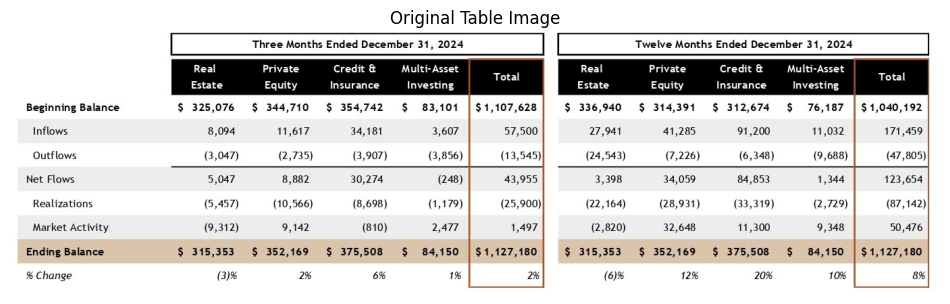

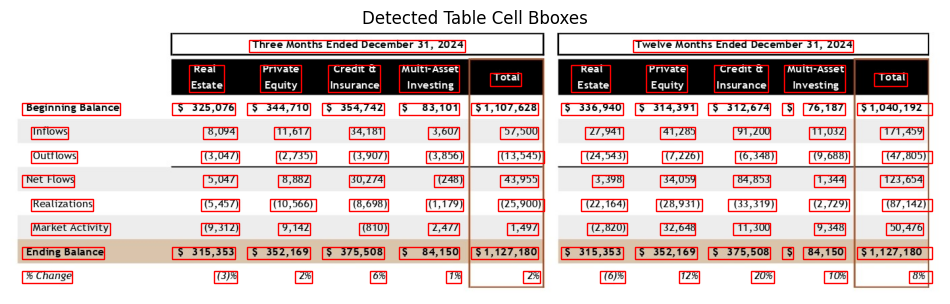

Execution time: 14.165885925292969 seconds


In [21]:
recognize_table("/kaggle/input/tables-different-cases-cropped/Blackstone4Q24EarningsPressRelease_page-0020_cropped.jpg")

# **Conslusion**

Overall, UniTable manages to extract and recognize most of the tables correctly, with some cases where it fails, particularly when the structure of the table is unusual or difficult.